<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [0]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [0]:
import json

In [0]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
from tqdm import tqdm
import h5py

In [0]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
# !conda install -y h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [0]:
def download_data(output_dir="attention_data"):
    import subprocess
  
    yadiskLink = "https://yadi.sk/d/KGh1SngBWH4stg"
    os.makedirs(output_dir, exist_ok=True)

    for filename in ["img_codes.hdf5", "captions_tokenized.json", "captions.json"]:
        command = f'curl "https://cloud-api.yandex.net/v1/disk/public/resources/download?public_key={yadiskLink}&path=/{filename}"'
        process = subprocess.Popen(command, stdout=subprocess.PIPE, shell=True)
        (out, err) = process.communicate()

        path_to_save = os.path.join(output_dir, filename)
        wgetLink = out.decode().split(',')[0][8:]
        wgetCommand = f"wget {wgetLink} -O {path_to_save}"
        print(f"Downloading {filename} ...")
        process = subprocess.Popen(wgetCommand, stdin=subprocess.PIPE, shell=True)
        # process.stdin.write(‘e’.encode())
        process.wait()

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [11]:
download_data()

In [0]:
f = h5py.File('attention_data/img_codes.hdf5', 'r')
img_codes = f['data']

In [0]:
captions = json.load(open('attention_data/captions_tokenized.json'))

In [14]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [0]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [0]:
# Build a Vocabulary
from collections import Counter
from itertools import chain

#Compute word frequencies for each word in captions. See code above for data structure
clist = (chain(*c) for c in captions)
words_chain = chain(*(list(c) for c in clist))
word_counts = Counter(words_chain)


In [17]:
word_counts.most_common(3)

[('a', 978125), ('#START#', 591435), ('#END#', 591435)]

In [0]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [0]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [20]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [0]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [0]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        dim = keys.shape[-1]
        return torch.bmm(queries, keys.transpose(1, 2)) / np.sqrt(dim)

Test for ScaledDotProductScore

In [23]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [0]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer
        self.comp_weights = torch.nn.Softmax(dim=2)
        self.attention_map = None

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        weights = self.comp_weights(scores)
        self.attention_map = weights
        self.last_weights = self.attention_map
        result = torch.bmm(weights, values)
        return result


Tests for Attention layer

In [0]:
attn = Attention(ScaledDotProductScore())

In [0]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [0]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.last_weights).sum() == 0
assert torch.isnan(a).sum() == 0

In [28]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.last_weights)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


In [0]:
# Attention map:
#  tensor([[[0.2483, 0.5035, 0.2483],
#          [0.2483, 0.2483, 0.5035]]])
# Responses:
#  tensor([[[1.0000],
#          [1.2552]]])

In [0]:
def print_shapes(*args):
    def retrieve_name(var):
        import inspect
        callers_local_vars = inspect.currentframe().f_back.f_back.f_locals.items()
        return [var_name for var_name, var_val in callers_local_vars if var_val is var]

    for i in args:
        print(*retrieve_name(i), "\b:", i.shape, end=' ')
    print()

### Language model

In [0]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # TODO: set number of layers
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = torch.nn.Embedding(n_tokens, emb_size)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(scorer=ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = torch.nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        # self.lstm = torch.nn.LSTM(input_size=lstm_units, hidden_size=lstm_units, num_layers=3)
        self.lstm = torch.nn.LSTMCell(input_size=(emb_size + cnn_channels), hidden_size=lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = torch.nn.Linear(lstm_units + cnn_channels + emb_size, n_tokens)
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)
        
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]

        h, c = initial_hid, initial_cell
        keys = self.cnn_to_attn_key(image_features)

        reccurent_out = []
        attention_map = []
        for emb in captions_emb.unbind(dim=1):
            context = self.attention(queries=h.unsqueeze(dim=1), keys=keys, values=image_features)
            attention = self.attention.attention_map
            lstm_inp = torch.cat([emb, context.squeeze(dim=1)], dim=-1)
            
            # h_t, c_t = self.lstm(lstm_inp, (h, c))
            h, c = self.lstm(lstm_inp, (h, c))
            # current lstm hidden state, attention response, and the previous word embedding

            # curent_reccurent = torch.cat([h_t, context.squeeze(dim=1), emb], dim=-1)
            curent_reccurent = torch.cat([h, context.squeeze(dim=1), emb], dim=-1)
            reccurent_out.append(curent_reccurent)
            attention_map.append(attention.squeeze(dim=1))

            # h, c = h_t, c_t
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        reccurent_out = torch.stack(reccurent_out, dim=1)
        attention_map = torch.stack(attention_map, dim=1)
        logits = self.logits_mlp(reccurent_out)
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [0]:
network = CaptionNet(n_tokens)

In [33]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


In [0]:
# logits shape: torch.Size([5, 14, 10403])
# attention map shape: torch.Size([5, 14, 81])

#### Train loss function

In [0]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    # print(captions_ix.shape)
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    # print(captions_ix_next.shape, captions_ix_next[0][0])
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    pred_probs = F.softmax(logits_for_next, dim=-1)
    N, L, T = pred_probs.shape
    # print_shapes(pred_probs)
    pred_tgt_probs = torch.gather(pred_probs.view(-1, T), dim=1, index=captions_ix_next.view(-1, 1))
    # print_shapes(pred_tgt_probs)
    mask = (captions_ix_inp != pad_ix)
    mask = mask.view(-1, 1).float()
    loss = torch.sum(-torch.log(pred_tgt_probs) * mask) / mask.sum()

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [0]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [0]:
from torch.optim import Adam
optimizer = Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [0]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [0]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [0]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainig speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [41]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3\~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5\~3.7

In [0]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [0]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 128  # adjust me
n_validation_batches = 16  # how many batches are used for validation after each epoch

In [43]:
from tqdm import tqdm as tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
        
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()
        
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 128/128 [00:11<00:00, 11.05it/s]



Epoch: 0, train loss: 5.025584410876036, val loss: 4.235039174556732


100%|██████████| 128/128 [00:11<00:00, 11.54it/s]



Epoch: 1, train loss: 4.043427120894194, val loss: 3.9334973990917206


100%|██████████| 128/128 [00:10<00:00, 11.43it/s]



Epoch: 2, train loss: 3.8083551935851574, val loss: 3.7198724299669266


100%|██████████| 128/128 [00:10<00:00, 11.65it/s]



Epoch: 3, train loss: 3.6847214605659246, val loss: 3.605912506580353


100%|██████████| 128/128 [00:10<00:00, 11.41it/s]



Epoch: 4, train loss: 3.59636645950377, val loss: 3.5582893788814545


100%|██████████| 128/128 [00:10<00:00, 11.69it/s]



Epoch: 5, train loss: 3.495519382879138, val loss: 3.5051939487457275


100%|██████████| 128/128 [00:10<00:00, 11.67it/s]



Epoch: 6, train loss: 3.4502288065850735, val loss: 3.5022037774324417


100%|██████████| 128/128 [00:10<00:00, 11.95it/s]



Epoch: 7, train loss: 3.4250693134963512, val loss: 3.40984845161438


100%|██████████| 128/128 [00:10<00:00, 11.75it/s]



Epoch: 8, train loss: 3.39531509578228, val loss: 3.2912953197956085


100%|██████████| 128/128 [00:10<00:00, 11.48it/s]



Epoch: 9, train loss: 3.366426443681121, val loss: 3.371491402387619


100%|██████████| 128/128 [00:10<00:00, 12.01it/s]



Epoch: 10, train loss: 3.3194541912525892, val loss: 3.321041166782379


100%|██████████| 128/128 [00:10<00:00, 11.97it/s]



Epoch: 11, train loss: 3.295267852023244, val loss: 3.303746744990349


100%|██████████| 128/128 [00:10<00:00, 10.67it/s]



Epoch: 12, train loss: 3.2636703308671713, val loss: 3.3103256076574326


100%|██████████| 128/128 [00:10<00:00, 12.06it/s]



Epoch: 13, train loss: 3.237019546329975, val loss: 3.250864550471306


100%|██████████| 128/128 [00:10<00:00, 12.30it/s]



Epoch: 14, train loss: 3.2016184013336897, val loss: 3.2216050177812576


100%|██████████| 128/128 [00:10<00:00, 11.34it/s]



Epoch: 15, train loss: 3.1545357778668404, val loss: 3.2222582697868347


100%|██████████| 128/128 [00:10<00:00, 11.77it/s]



Epoch: 16, train loss: 3.171499902382493, val loss: 3.201437830924988


100%|██████████| 128/128 [00:10<00:00, 11.66it/s]



Epoch: 17, train loss: 3.1724842377007008, val loss: 3.200876608490944


100%|██████████| 128/128 [00:10<00:00, 12.69it/s]



Epoch: 18, train loss: 3.1375745218247175, val loss: 3.2228986769914627


100%|██████████| 128/128 [00:10<00:00, 12.06it/s]



Epoch: 19, train loss: 3.146156180649996, val loss: 3.116893023252487


100%|██████████| 128/128 [00:10<00:00, 11.88it/s]



Epoch: 20, train loss: 3.139101304113865, val loss: 3.1195329278707504


100%|██████████| 128/128 [00:10<00:00, 11.73it/s]



Epoch: 21, train loss: 3.122153287753463, val loss: 3.192927673459053


100%|██████████| 128/128 [00:10<00:00, 12.06it/s]



Epoch: 22, train loss: 3.1098634153604507, val loss: 3.097917824983597


100%|██████████| 128/128 [00:10<00:00, 12.02it/s]



Epoch: 23, train loss: 3.1069877352565527, val loss: 3.1499210596084595


100%|██████████| 128/128 [00:10<00:00, 11.79it/s]



Epoch: 24, train loss: 3.1202179808169603, val loss: 3.170269936323166


100%|██████████| 128/128 [00:10<00:00, 11.36it/s]



Epoch: 25, train loss: 3.0945236701518297, val loss: 3.100391760468483


100%|██████████| 128/128 [00:10<00:00, 12.44it/s]



Epoch: 26, train loss: 3.0543755516409874, val loss: 3.1053794473409653


100%|██████████| 128/128 [00:10<00:00, 12.51it/s]



Epoch: 27, train loss: 3.046410446986556, val loss: 3.1159289330244064


100%|██████████| 128/128 [00:10<00:00, 12.06it/s]



Epoch: 28, train loss: 3.0516561288386583, val loss: 3.097975045442581


100%|██████████| 128/128 [00:10<00:00, 11.88it/s]



Epoch: 29, train loss: 3.0347391068935394, val loss: 3.139168903231621


100%|██████████| 128/128 [00:10<00:00, 11.72it/s]



Epoch: 30, train loss: 3.023417180404067, val loss: 3.149260640144348


100%|██████████| 128/128 [00:11<00:00, 11.52it/s]



Epoch: 31, train loss: 3.045878127217293, val loss: 3.0717909932136536


100%|██████████| 128/128 [00:10<00:00, 12.23it/s]



Epoch: 32, train loss: 3.01234551332891, val loss: 3.0755888372659683


100%|██████████| 128/128 [00:11<00:00, 11.73it/s]



Epoch: 33, train loss: 3.024924648925662, val loss: 3.067402333021164


100%|██████████| 128/128 [00:10<00:00, 11.84it/s]



Epoch: 34, train loss: 3.011045053601265, val loss: 3.0837714970111847


100%|██████████| 128/128 [00:11<00:00, 11.48it/s]



Epoch: 35, train loss: 3.0038102716207504, val loss: 3.039469391107559


100%|██████████| 128/128 [00:11<00:00, 11.48it/s]



Epoch: 36, train loss: 3.0103570502251387, val loss: 3.088099643588066


100%|██████████| 128/128 [00:11<00:00, 10.59it/s]



Epoch: 37, train loss: 3.008357869461179, val loss: 3.074285611510277


100%|██████████| 128/128 [00:11<00:00, 11.48it/s]



Epoch: 38, train loss: 2.992984350770712, val loss: 3.064986929297447


100%|██████████| 128/128 [00:11<00:00, 11.96it/s]



Epoch: 39, train loss: 2.96749004162848, val loss: 3.012772172689438


100%|██████████| 128/128 [00:10<00:00, 12.32it/s]



Epoch: 40, train loss: 2.945231094956398, val loss: 3.081034168601036


100%|██████████| 128/128 [00:11<00:00, 11.75it/s]



Epoch: 41, train loss: 2.9527460876852274, val loss: 3.08383746445179


100%|██████████| 128/128 [00:11<00:00, 10.65it/s]



Epoch: 42, train loss: 2.953372536227107, val loss: 3.0514298379421234


100%|██████████| 128/128 [00:11<00:00, 11.52it/s]



Epoch: 43, train loss: 2.9496665205806494, val loss: 3.052554666996002


100%|██████████| 128/128 [00:11<00:00, 11.10it/s]



Epoch: 44, train loss: 2.958074042573571, val loss: 3.0025501400232315


100%|██████████| 128/128 [00:11<00:00, 11.39it/s]



Epoch: 45, train loss: 2.955495884642005, val loss: 3.0063975155353546


100%|██████████| 128/128 [00:11<00:00, 10.70it/s]



Epoch: 46, train loss: 2.9438895657658577, val loss: 3.013413965702057


100%|██████████| 128/128 [00:10<00:00, 11.67it/s]



Epoch: 47, train loss: 2.93853715993464, val loss: 3.072264865040779


100%|██████████| 128/128 [00:11<00:00, 11.35it/s]



Epoch: 48, train loss: 2.933524005115032, val loss: 3.017022579908371


100%|██████████| 128/128 [00:10<00:00, 11.80it/s]



Epoch: 49, train loss: 2.916377017274499, val loss: 3.03489987552166


100%|██████████| 128/128 [00:11<00:00, 11.63it/s]



Epoch: 50, train loss: 2.931977391242981, val loss: 3.0611226111650467


100%|██████████| 128/128 [00:10<00:00, 12.03it/s]



Epoch: 51, train loss: 2.908047055825591, val loss: 3.0320242196321487


100%|██████████| 128/128 [00:10<00:00, 11.96it/s]



Epoch: 52, train loss: 2.8902846444398165, val loss: 3.049453169107437


100%|██████████| 128/128 [00:10<00:00, 11.65it/s]



Epoch: 53, train loss: 2.911783726885915, val loss: 2.9977733492851257


100%|██████████| 128/128 [00:11<00:00, 11.58it/s]



Epoch: 54, train loss: 2.904388528317213, val loss: 2.9854980260133743


100%|██████████| 128/128 [00:11<00:00, 11.51it/s]



Epoch: 55, train loss: 2.8780345115810633, val loss: 3.015664264559746


100%|██████████| 128/128 [00:11<00:00, 11.37it/s]



Epoch: 56, train loss: 2.907641850411892, val loss: 2.999043747782707


100%|██████████| 128/128 [00:11<00:00, 11.45it/s]



Epoch: 57, train loss: 2.880847217515111, val loss: 2.9922273755073547


100%|██████████| 128/128 [00:11<00:00, 10.66it/s]



Epoch: 58, train loss: 2.892226628959179, val loss: 2.973494440317154


100%|██████████| 128/128 [00:11<00:00, 11.45it/s]



Epoch: 59, train loss: 2.890670394524932, val loss: 3.026020437479019


100%|██████████| 128/128 [00:11<00:00, 11.66it/s]



Epoch: 60, train loss: 2.88190178014338, val loss: 3.003170430660248


100%|██████████| 128/128 [00:11<00:00, 11.94it/s]



Epoch: 61, train loss: 2.8877417389303446, val loss: 2.992429479956627


100%|██████████| 128/128 [00:11<00:00, 11.81it/s]



Epoch: 62, train loss: 2.890198176726699, val loss: 2.969021275639534


100%|██████████| 128/128 [00:11<00:00, 10.77it/s]



Epoch: 63, train loss: 2.877593159675598, val loss: 3.0188686847686768
Finished!


In [0]:
path = "/content/drive/My Drive/attn_0610_1.pth"
torch.save(network.state_dict(), path)

In [45]:
network = CaptionNet(n_tokens)
network.load_state_dict(torch.load(path))
network.eval()

CaptionNet(
  (cnn_to_h0): Linear(in_features=512, out_features=256, bias=True)
  (cnn_to_c0): Linear(in_features=512, out_features=256, bias=True)
  (emb): Embedding(10403, 128)
  (attention): Attention(
    (scorer): ScaledDotProductScore()
    (comp_weights): Softmax(dim=2)
  )
  (cnn_to_attn_key): Linear(in_features=512, out_features=256, bias=True)
  (lstm): LSTMCell(640, 256)
  (logits_mlp): Linear(in_features=896, out_features=10403, bias=True)
)

### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [46]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:11<00:00, 51.4MB/s]


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [0]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [0]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

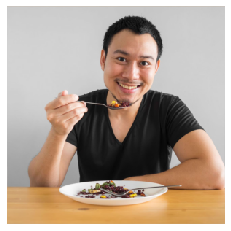

In [49]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man with a beard and a tie and a woman on a plate .
a young man is in a white shirt and tie .
a young man is holding a plate of food .
a man in a black shirt and tie .
a man in a white shirt and tie with a bowl of food on it .
a man with a beard and a tie in his mouth .
a man is holding a plate with a fork and a fork .
a man in a white shirt and tie holding a plate of food .
a man in a white shirt and tie with a white shirt and a red shirt and a tie .
a man with a beard and a tie with a knife .


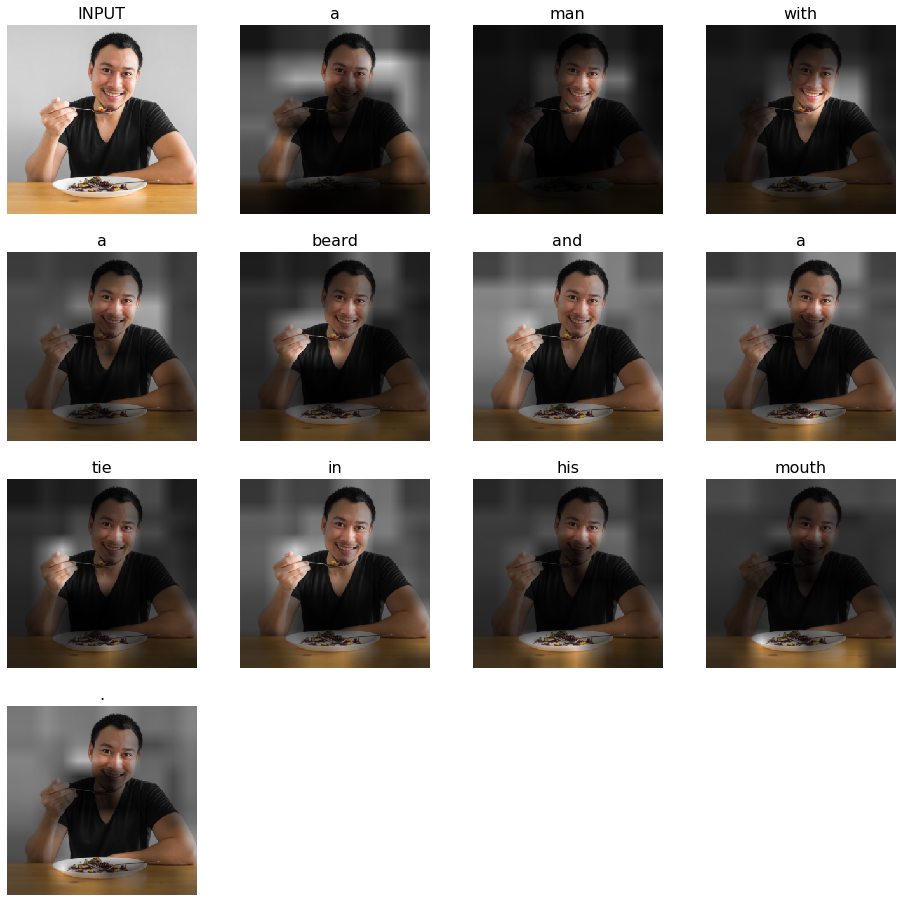

In [50]:
process_image(img)

a man riding a bike down a road with a dog .
a man is riding a bike on a road .
a man is riding a bike on a road .
a man is riding a bike on a road .
a man is riding a bike on a road .
a man is riding a bike on the side of a road .
a man is riding a bike on a road .
a man is riding a bike on a road .
a man is riding a bike on a road .
a man is riding a bike down a road .


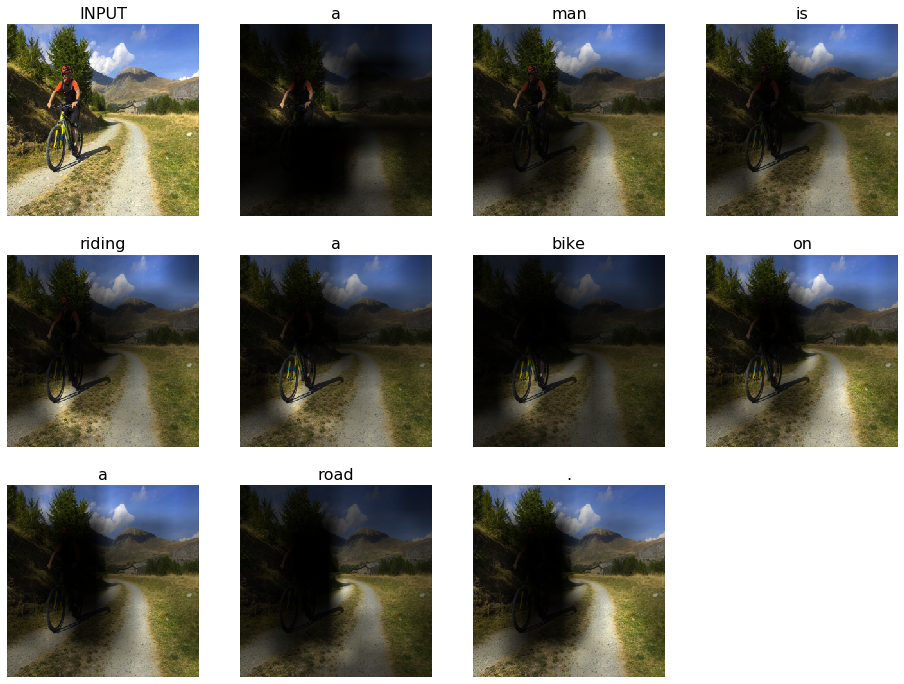

In [51]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a black and white cat laying on a couch
a black and white cat laying on a couch .
a cat that is laying down on a couch
a black and white cat laying on a couch .
a black and white cat laying on a couch
a cat that is laying on a couch
a cat that is laying on a couch .
a black and white cat sitting on a couch
a black and white cat laying on a couch
a black and white cat laying on a couch .


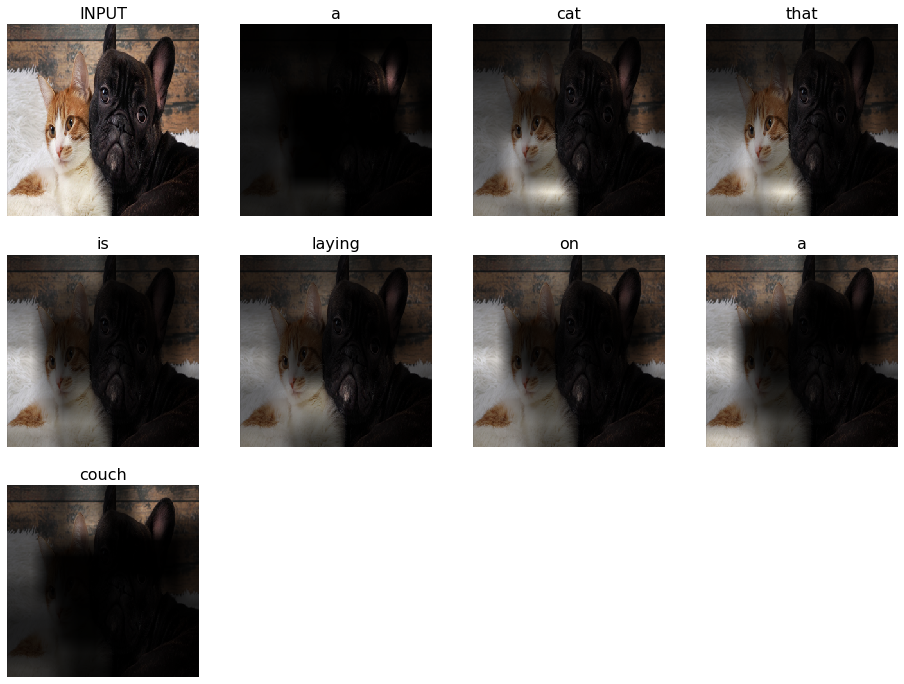

In [52]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard on a skateboard .
a man in a black and white shirt doing a trick on a skateboard .
a man riding a skateboard on a skate board .
a man in a skate board rides a skate board
a man riding a skateboard on a skateboard .
a man riding a skateboard on top of a ramp .
a man riding a skateboard on a skateboard .
a man riding a skateboard on a skate board .
a man riding a skateboard on a skateboard .
a man riding a skateboard down a street .


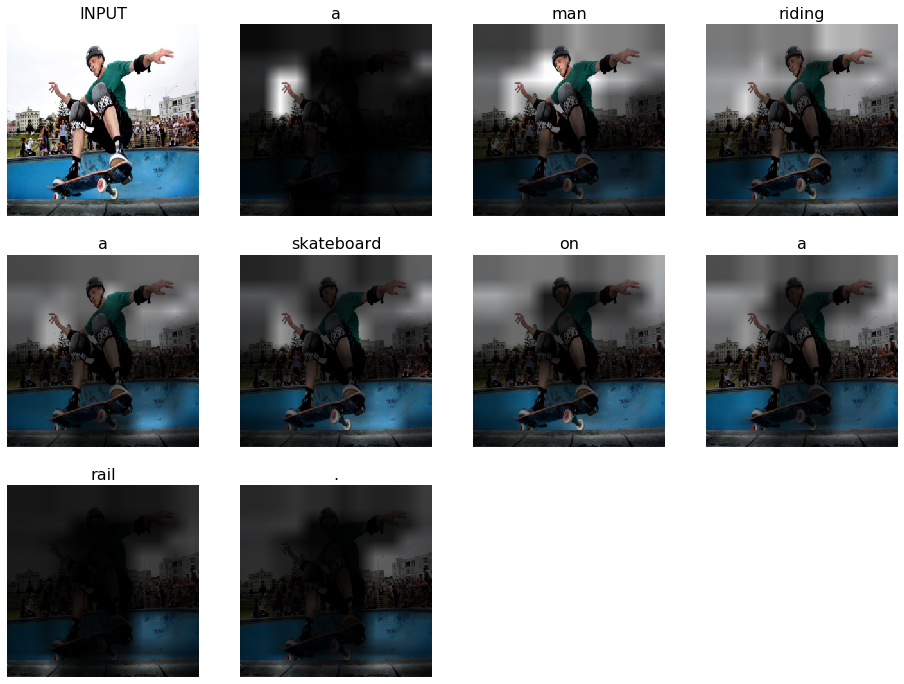

In [53]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

a dog laying on a rug on a leash .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog laying on a rug on a leash
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog sitting on a chair with a remote control .
a dog laying on a rug with a remote control .
a dog that is laying on a rug .


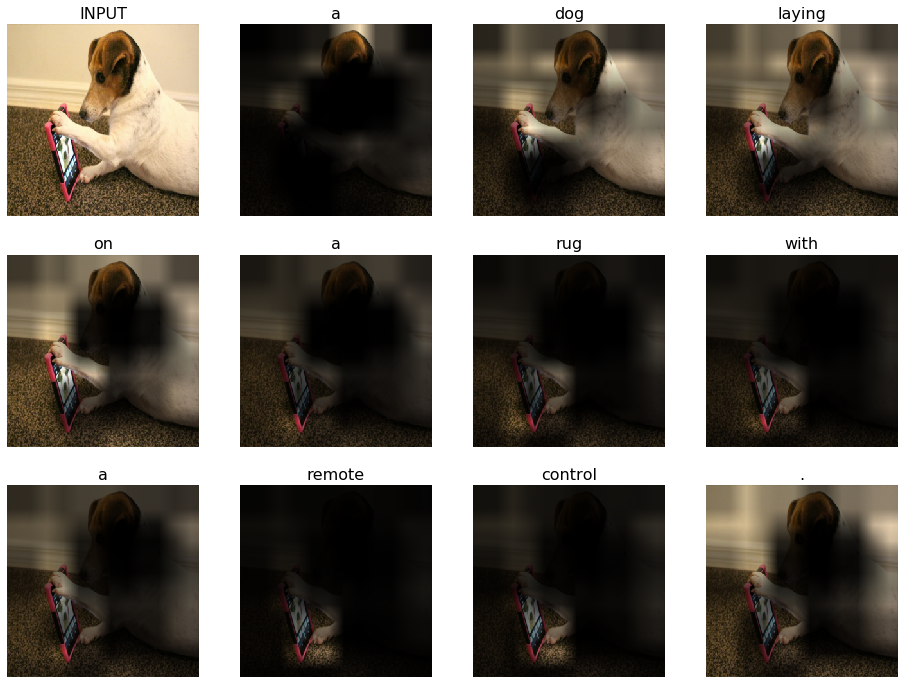

In [53]:
# process_image(obtain_image(filename="/home/oleg/usa00/IMG_20190520_125121.jpg"))
process_image(obtain_image(url="https://www.rover.com/blog/wp-content/uploads/2016/06/sam-the-jack-iphone-1024x683.jpg"))


# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

In [0]:
url_list = [
    # dogs doing things
    "https://www.rover.com/blog/wp-content/uploads/2016/06/sam-the-jack-iphone-1024x683.jpg",
    "https://thumbs.dreamstime.com/b/%D0%BC%D0%B8-%D0%B0%D1%8F-%D1%81%D0%BE%D0%B1%D0%B0%D0%BA%D0%B0-%D0%BA%D0%B0%D0%BA-%D1%81%D0%B0-%D0%BE%D0%B2%D0%BD%D0%B8%D0%BA-%D0%B2%D1%8B%D1%80%D1%83%D1%87%D0%B0%D1%8F-%D0%BC%D0%BE%D1%87%D0%B0-%D1%87%D0%BE%D0%BD%D1%81%D0%B5%D1%80%D0%B2%D0%BD%D1%83%D1%8E-%D0%B1%D0%B0%D0%BD%D0%BA%D1%83-%D1%8F-%D0%BF%D0%BE-%D0%B8%D0%B2%D0%B0-78945626.jpg",
    "https://pbs.twimg.com/media/D7_nfmJW4AA0v7P.jpg:large",
    "https://i.ytimg.com/vi/5rKQ8kW6hCU/maxresdefault.jpg",
    "https://s3.amazonaws.com/ebaumsworld.prod/uploads1515440890798-ne2SgVE.jpg",
    
    # cats doing things
    "https://i.ytimg.com/vi/N5EauePzYqw/maxresdefault.jpg",
    "https://cdn.callbackhunter.com/images/2015/02/cat-twitter.jpg?",
    "https://i.pinimg.com/originals/fd/c6/f5/fdc6f56dfe524df7ac86e3e4535ebcfa.jpg",
    "https://i.imgflip.com/2k1k1z.jpg",
    "https://avatars.mds.yandex.net/get-pdb/1025945/6a975223-cd6e-4183-ab70-0dd745e42da4/s1200",
]


https://www.rover.com/blog/wp-content/uploads/2016/06/sam-the-jack-iphone-1024x683.jpg
a dog looking at a computer keyboard .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog laying on a rug with a remote control .
a dog is laying on a rug on a rug .
a dog laying on the floor next to a remote control .
a dog sitting on a couch with a remote control .
a dog laying on a rug with a remote control .


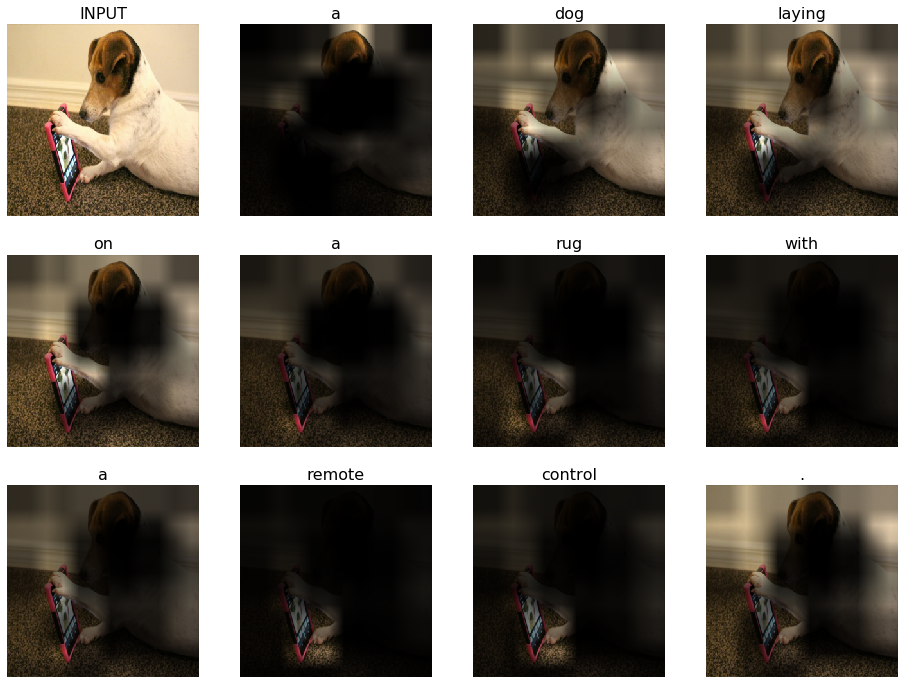

https://thumbs.dreamstime.com/b/%D0%BC%D0%B8-%D0%B0%D1%8F-%D1%81%D0%BE%D0%B1%D0%B0%D0%BA%D0%B0-%D0%BA%D0%B0%D0%BA-%D1%81%D0%B0-%D0%BE%D0%B2%D0%BD%D0%B8%D0%BA-%D0%B2%D1%8B%D1%80%D1%83%D1%87%D0%B0%D1%8F-%D0%BC%D0%BE%D1%87%D0%B0-%D1%87%D0%BE%D0%BD%D1%81%D0%B5%D1%80%D0%B2%D0%BD%D1%83%D1%8E-%D0%B1%D0%B0%D0%BD%D0%BA%D1%83-%D1%8F-%D0%BF%D0%BE-%D0%B8%D0%B2%D0%B0-78945626.jpg
a dog with a leash in its mouth with a leash on a leash .
a dog with a leash in its mouth and a leash .
a dog sitting on a leash with a leash in its mouth .
a dog with a leash in its mouth with a leash in the back .
a dog on a leash with a leash in its mouth .
a dog and a dog standing on a leash .
a dog on a leash with a leash in its mouth .
a dog with a leash in its mouth and a leash .
a dog that is standing in the grass with a frisbee .
a dog with a leash in its mouth with a leash in the mouth .


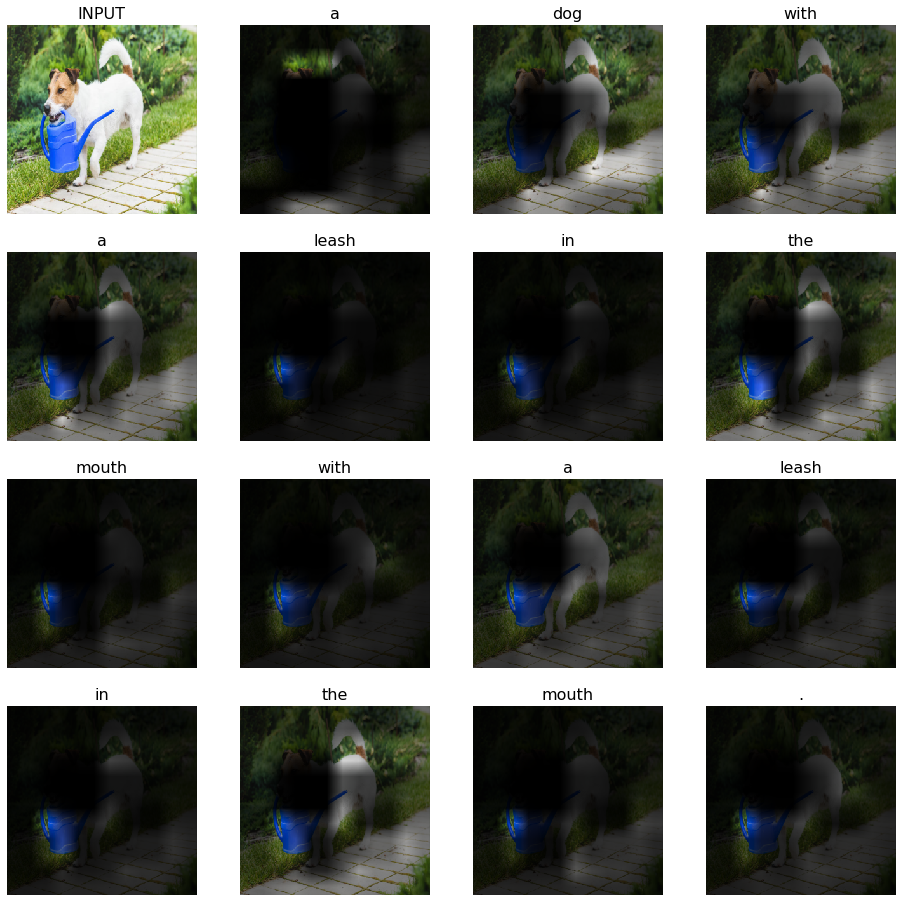

https://pbs.twimg.com/media/D7_nfmJW4AA0v7P.jpg:large
a dog laying on a desk with a laptop on it .
a dog sitting on a desk with a laptop .
a dog laying on a desk with a laptop .
a dog laying on a desk with a laptop on it .
a dog laying on a computer keyboard on a desk .
a dog laying on a desk with a laptop .
a dog sitting on a desk with a laptop .
a dog sitting on a laptop computer on a desk .
a dog laying on a desk with a laptop .
a dog sitting on a desk with a laptop .


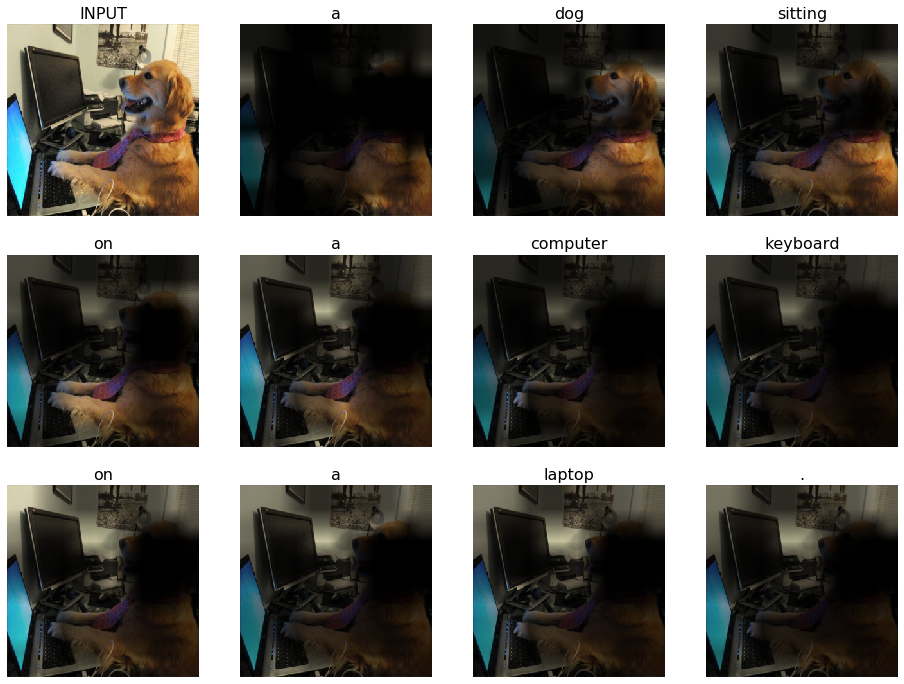

https://i.ytimg.com/vi/5rKQ8kW6hCU/maxresdefault.jpg
a dog looking at the camera while looking at a window .
a dog looking out of a window in a house .
a dog sitting on a chair in a kitchen .
a dog sitting on the ground looking out of a window .
a dog looking out of a window with a door open .
a dog looking out of a window in a house .
a dog looking out of a window with a door open .
a dog looking out of a window with a door open .
a dog looking out of a window with a door open .
a dog sitting on a chair in a bathroom .


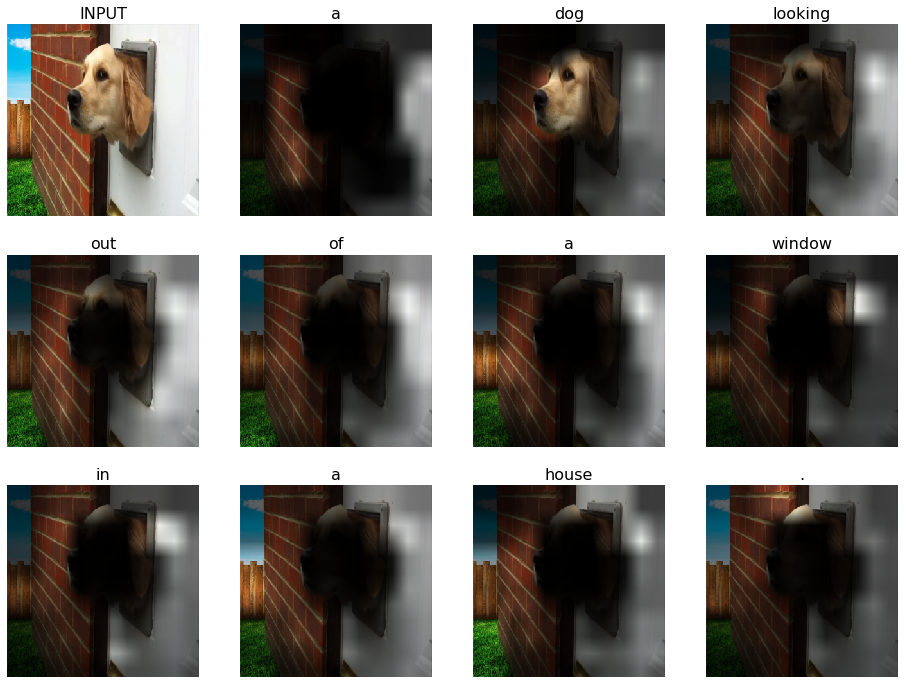

https://s3.amazonaws.com/ebaumsworld.prod/uploads1515440890798-ne2SgVE.jpg
a dog sitting on a table with a cat .
a dog and a cat sitting on a table .
a golden retriever with a dog and a cat .
a dog and a cat sitting on a table .
a dog sitting on a table with a cat and a cat .
a dog sitting on a table with a laptop and a cat .
a dog sitting on a table with a cat and a cat .
a dog sitting on a table with a cat .
a dog sitting on a table with a cat and a cat .
a dog and a cat sitting on a table .


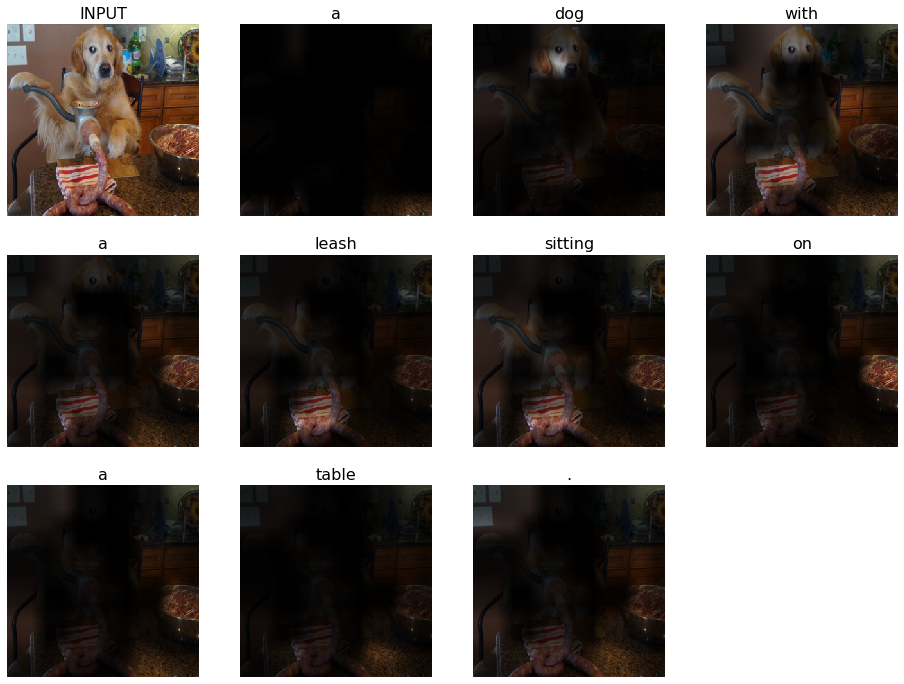

https://i.ytimg.com/vi/N5EauePzYqw/maxresdefault.jpg
a cat sitting on top of a computer keyboard .
a cat is sitting on a couch with a laptop .
a cat is sitting on a computer keyboard .
a cat is sitting on a computer keyboard .
a cat sitting on top of a computer keyboard .
a cat is sitting on a desk with a laptop .
a cat is sitting on a computer keyboard .
a cat is sitting on a couch with a laptop .
a cat is sitting on a desk next to a keyboard .
a cat is sitting on a couch with a laptop .


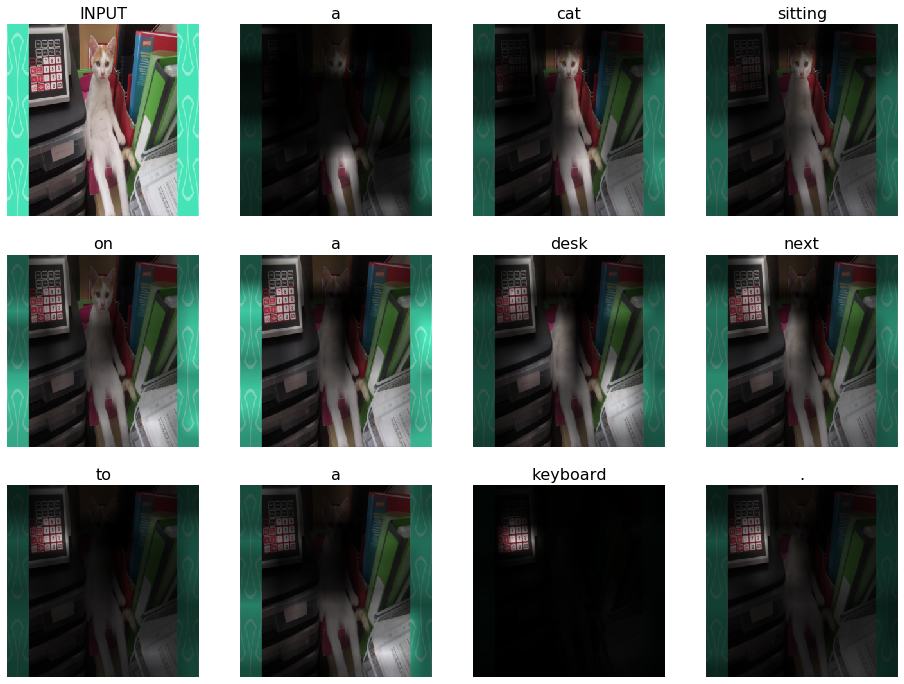

https://cdn.callbackhunter.com/images/2015/02/cat-twitter.jpg?
a cat sitting on a desk with a laptop on top of it .
a cat sitting on a chair with a mouse and a mouse .
a cat sitting on a desk with a mouse and a cat .
a cat sitting on a chair with a cat on top of it .
a cat is sitting on a rug with a cat on top of it .
a cat sitting on a chair with a cat on top of it .
a cat sitting on a chair with a cat on top of it .
a cat sitting on top of a table with a remote .
a cat is sitting on a couch with a cat on the floor .
a cat sitting on a desk with a laptop on it .


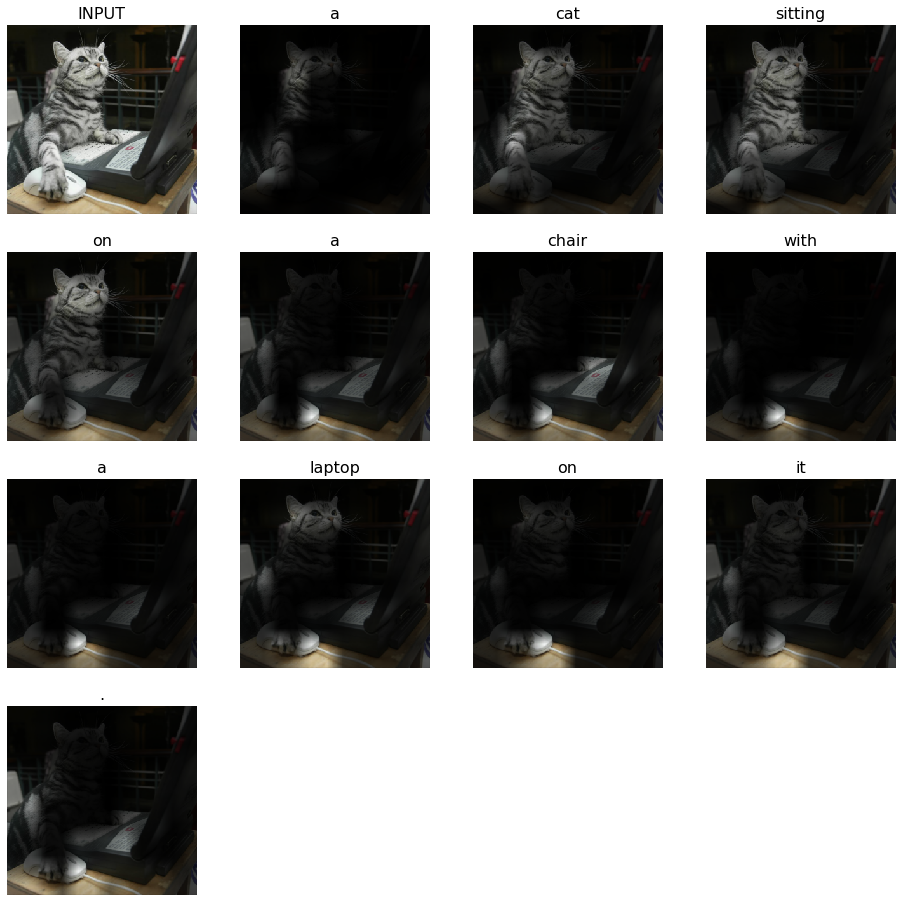

https://i.pinimg.com/originals/fd/c6/f5/fdc6f56dfe524df7ac86e3e4535ebcfa.jpg
a cat sitting on a toilet seat with a cat on top of it .
a cat sitting on top of a white toilet bowl .
a cat sitting in a white toilet bowl .
a cat sitting on top of a white toilet bowl .
a cat sitting on a white toilet seat .
a cat sitting on a toilet seat with a cat on top of it .
a cat sitting on top of a toilet bowl .
a cat sitting on top of a white toilet bowl .
a cat sitting on a toilet seat with a cat on top of it .
a cat sitting on top of a toilet bowl .


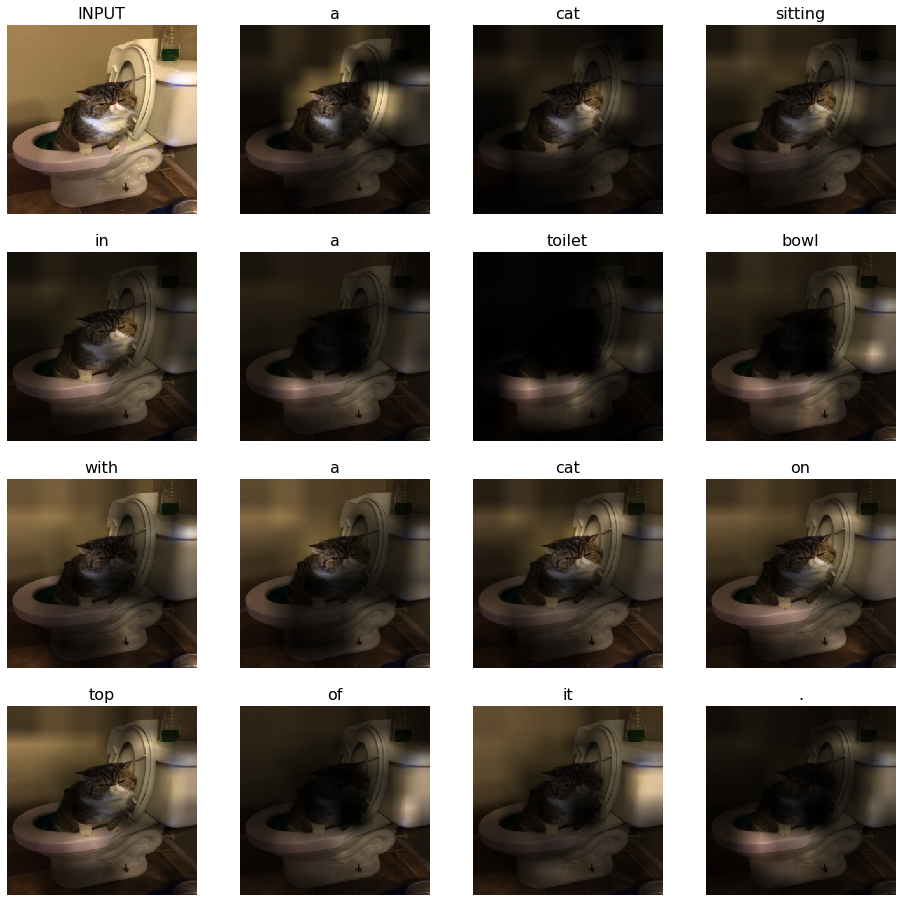

https://i.imgflip.com/2k1k1z.jpg
a white and white cat sitting on a bed with a book .
a cat sitting on top of a bed with a pillow .
a cat that is laying on a bed
a white and white cat sitting on top of a bed .
a cat that is laying on a bed
a cat is laying on a bed with a pillow .
a cat sitting on top of a bed with a book .
a cat sitting on top of a bed with pillows .
a cat sitting on top of a bed with a book .
a cat sitting on top of a bed with a pillow .


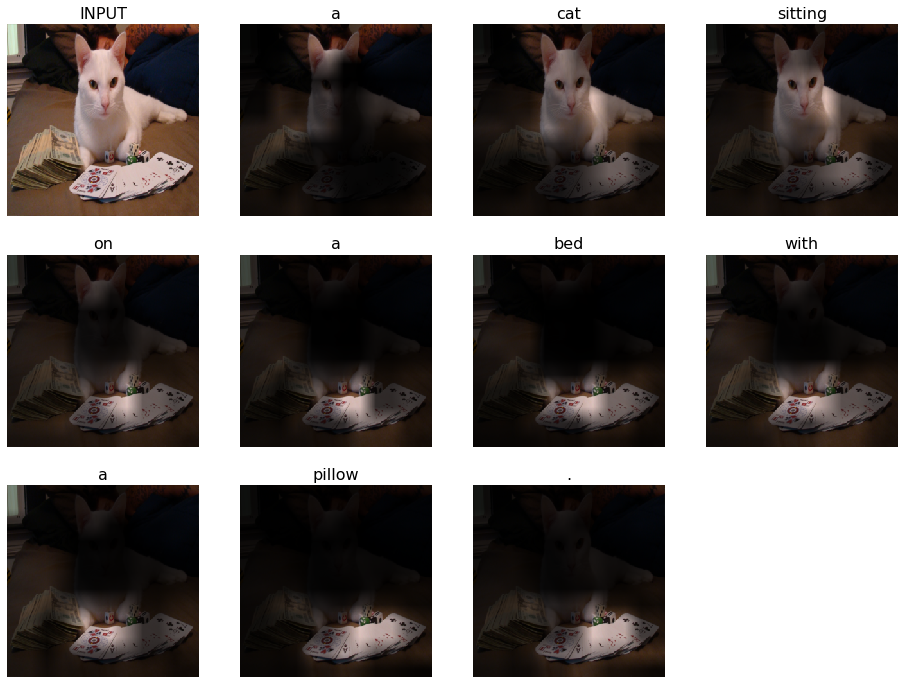

https://avatars.mds.yandex.net/get-pdb/1025945/6a975223-cd6e-4183-ab70-0dd745e42da4/s1200
a cat sitting on top of a toilet in a bathroom .
a cat sitting on top of a toilet in a bathroom .
a cat sitting on a kitchen floor next to a microwave .
a cat sitting on a kitchen floor next to a cup of coffee .
a cat sitting on top of a toilet in a bathroom .
a cat sitting on top of a bathroom sink .
a cat sitting on top of a kitchen sink .
a cat sitting on top of a kitchen table .
a cat sitting on top of a toilet in a bathroom .
a cat is sitting on a toilet in a bathroom .


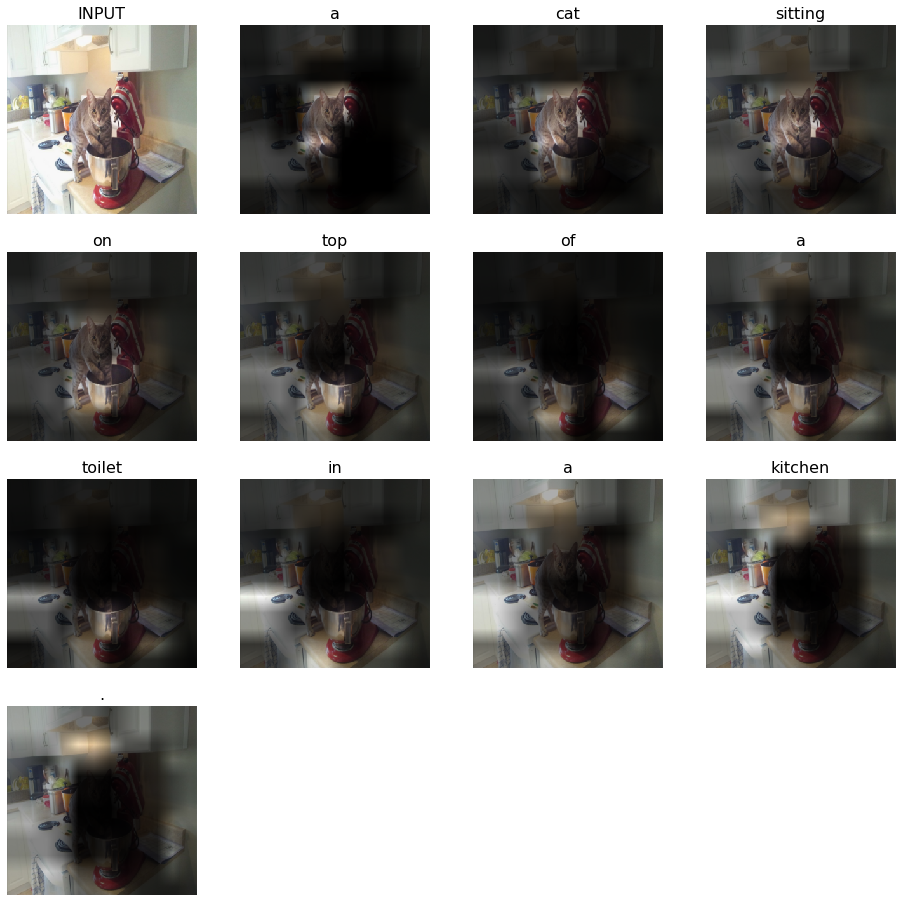

In [82]:
for url in url_list:
    print(url)
    process_image(obtain_image(url=url))
    plt.show()

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563